<a href="https://colab.research.google.com/github/Astralllllll/Data-Wrangling/blob/main/Airplane_Crashes_Data_Cleaning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Practical Exercise 2: Data Cleaning — Airplane Crashes Dataset
** Lenny Githui - 189590**
** Karl Kamau - 191923**
** Jeremy Kigen - 184821**


Question 1

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_rows', 100)

from google.colab import files
uploaded = files.upload()
file_name = next(iter(uploaded))

df = pd.read_csv(file_name)
df.head()

Saving Airplane_Crashes_and_Fatalities_Since_1908.csv to Airplane_Crashes_and_Fatalities_Since_1908.csv


,Date,Time,Location,Operator,Flight #,Route,Type,Registration,cn/In,Aboard,Fatalities,Ground,Summary
0,09/17/1908,17:18,"Fort Myer, Virginia",Military - U.S. Army,NaN,Demonstration,Wright Flyer III,NaN,1,2.0,1.0,0.0,"During a demonstration flight, a U.S. Army fly..."
1,07/12/1912,06:30,"AtlantiCity, New Jersey",Military - U.S. Navy,NaN,Test flight,Dirigible,NaN,NaN,5.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...
2,08/06/1913,NaN,"Victoria, British Columbia, Canada",Private,-,NaN,Curtiss seaplane,NaN,NaN,1.0,1.0,0.0,The first fatal airplane accident in Canada oc...
3,09/09/1913,18:30,Over the North Sea,Military - German Navy,NaN,NaN,Zeppelin L-1 (airship),NaN,NaN,20.0,14.0,0.0,The airship flew into a thunderstorm and encou...
4,10/17/1913,10:30,"Near Johannisthal, Germany",Military - German Navy,NaN,NaN,Zeppelin L-2 (airship),NaN,NaN,30.0,30.0,0.0,Hydrogen gas which was being vented was sucked...


Question 2

In [2]:
rows, cols = df.shape
print(f"Number of rows: {rows}")
print(f"Number of columns: {cols}")

Number of rows: 5268
Number of columns: 13


In [ ]:
Question 3

In [3]:
df.tail(75)

,Date,Time,Location,Operator,Flight #,Route,Type,Registration,cn/In,Aboard,Fatalities,Ground,Summary
5193,03/15/2008,08:15,"Nbagu, Nigeria",Trade Wings Aviation Ltd.,NaN,Lagos - Bebi Air Strip,Beechcraft 1900D,5N-JAH,UE-322,3.0,3.0,0.0,The plane crashed while en route. Wreckage was...
5194,04/03/2008,11:00,"Lawa, Suriname",Blue Wing Airlines,NaN,Paramaribo - Lawa,Antonov An-28,PZ-TSO,1AJ007-17,19.0,19.0,0.0,While attempting to land the crew aborted the ...
5195,04/09/2008,23:27,"Bundeena, Australia",Avtex Air Services,NaN,Sydney - Brisbane,Swearingen SA227AC Metroliner III,VH-OZA,AC-600,1.0,1.0,0.0,The pilot of the mail plane reported some mino...
5196,04/11/2008,22:15,"Chrisinau, Moldova",Kata Transportation,NaN,"Chrisinau, Moldova - Antalya, Turkey - Sudan",Antonov An-32,ST-AZL,3009,8.0,8.0,0.0,Just minutes after the take off the plane trie...
5197,04/15/2008,14:30,"Goma, Congo",Hewa Bora Airways,NaN,Goma - Kisangani - Kinshasa,McDonnell Douglas DC-9-51,9Q-CHN,47731,85.0,0.0,47.0,"While attempting to takeoff, the plane failed ..."
5198,04/16/2008,14:23,"Off Annobon Island, Equatorial Guinea",Military - Government of Equatorial Guinea,NaN,Bata - Annobon Island,Antonov An-32B,3C-5GE,1609,13.0,13.0,0.0,Crashed into the ocean after skidding off the ...
5199,04/28/2008,09:38,"Off Crimea, Black Sea",Naftogaz,NaN,NaN,Mil Mi-8T,UR-24275,98734295,20.0,20.0,0.0,The helicopter crashed after the tail section ...
5200,05/02/2008,10:10,"Near Rumbek, Sudan",Southern Sudan Air Connection,NaN,Wau - Rumbek - Juba,Beechcraft 1900C,5Y-FLX,UC-65,24.0,24.0,0.0,The pilot radioed a control tower in the city ...
5201,05/17/2008,16:30,"Stehekin, Washington",Chelan Air Service,NaN,Chelan - Stehekin,de Havilland Canada DHC-2 Mark I Beaver,N5998Q,1151,5.0,2.0,0.0,The float plane flipped and crashed as it atte...
5202,05/23/2008,01:25,"Billings, Montana",Alpine Aviation,5008,Billings - Great Falls,Beechcraft 1900C,N195GA,U-65,1.0,1.0,0.0,"After taking off and being told to turn left,..."


Question 4

In [4]:
missing = pd.DataFrame({
    'Missing values': df.isnull().sum(),
    'Percent missing (%)': (df.isnull().mean() * 100).round(2)
})
missing

,Missing values,Percent missing (%)
Date,0,0.00
Time,2219,42.12
Location,20,0.38
Operator,18,0.34
Flight #,4199,79.71
Route,1707,32.40
Type,27,0.51
Registration,335,6.36
cn/In,1228,23.31
Aboard,22,0.42


The `Date` column has no missing values. For each of the other columns, the method depends on how much data is missing, the data type, and whether the value can be estimated without inventing facts about real crashes.

| Column | % Missing | Method | Justification |
|---|---|---|---|
| **Time** | ~42% | Fill with `'Unknown'` | Too much is missing to drop the rows. Crash times are random events, so filling in a mean or mode would create times that never happened. |
| **Location** | ~0.4% | Fill with `'Unknown'` | Very few rows are affected. Location is categorical and can't be inferred, but those rows still contain useful fatality data, so they are kept. |
| **Operator** | ~0.3% | Fill with `'Unknown'` | Only a handful of values are missing. Guessing the airline would be misleading. |
| **Flight #** | ~80% | Drop the column | Most values are missing. A flight number is only an identifier and adds little to the analysis. |
| **Route** | ~32% | Fill with `'Unknown'` | Too many values are missing to drop the rows, and the route can't be worked out from the other columns. |
| **Type** | ~0.5% | Fill with `'Unknown'` | Few values are missing, and aircraft type can't be estimated statistically. |
| **Registration** | ~6% | Fill with `'Unknown'` | It is a unique identifier, so imputing it makes no sense. The rows are kept for their other data. |
| **cn/In** | ~23% | Drop the column | This construction/line number is an identifier with little analytical value, and a large share is missing. |
| **Aboard** | ~0.4% | Drop the affected rows | The values are numeric and heavily skewed, from small planes to jumbo jets, so a mean or median would be unrealistic for any particular crash. So few rows are affected that dropping them has almost no effect. |
| **Fatalities** | ~0.2% | Drop the affected rows | This is the main variable being analysed, and imputing it would fabricate results. The loss is negligible. |
| **Ground** | ~0.4% | Fill with `0` (the mode) | Nearly all crashes had zero ground fatalities, so 0 is the most likely true value. |
| **Summary** | ~7% | Fill with `'No summary available'` | Free text can't be imputed. A placeholder keeps the rows and makes the gap visible. |

Question 5

In [5]:
fatality_locations = df[['Date', 'Location', 'Aboard', 'Fatalities']].copy()
fatality_locations.head()

,Date,Location,Aboard,Fatalities
0,09/17/1908,"Fort Myer, Virginia",2.0,1.0
1,07/12/1912,"AtlantiCity, New Jersey",5.0,5.0
2,08/06/1913,"Victoria, British Columbia, Canada",1.0,1.0
3,09/09/1913,Over the North Sea,20.0,14.0
4,10/17/1913,"Near Johannisthal, Germany",30.0,30.0


Question 6

In [6]:
max_idx = fatality_locations['Fatalities'].idxmax()
print(fatality_locations.loc[max_idx])

by_date = fatality_locations.groupby('Date')['Fatalities'].sum()
print("\nDate with highest total fatalities:", by_date.idxmax(), "-", int(by_date.max()))

Date                        03/27/1977
Location      Tenerife, Canary Islands
Aboard                           644.0
Fatalities                       583.0
Name: 2963, dtype: object

Date with highest total fatalities: 03/27/1977 - 583


Question 7

,Date,Location,Aboard,Fatalities,Survivors
0,09/17/1908,"Fort Myer, Virginia",2.0,1.0,1.0
1,07/12/1912,"AtlantiCity, New Jersey",5.0,5.0,0.0
2,08/06/1913,"Victoria, British Columbia, Canada",1.0,1.0,0.0
3,09/09/1913,Over the North Sea,20.0,14.0,6.0
4,10/17/1913,"Near Johannisthal, Germany",30.0,30.0,0.0
5,03/05/1915,"Tienen, Belgium",41.0,21.0,20.0
6,09/03/1915,"Off Cuxhaven, Germany",19.0,19.0,0.0
7,07/28/1916,"Near Jambol, Bulgeria",20.0,20.0,0.0
8,09/24/1916,"Billericay, England",22.0,22.0,0.0
9,10/01/1916,"Potters Bar, England",19.0,19.0,0.0


            Aboard   Fatalities    Survivors
count  5246.000000  5256.000000  5246.000000
mean     27.554518    20.068303     7.471026
std      43.076711    33.199952    28.144659
min       0.000000     0.000000     0.000000
25%       5.000000     3.000000     0.000000
50%      13.000000     9.000000     0.000000
75%      30.000000    23.000000     2.000000
max     644.000000   583.000000   516.000000


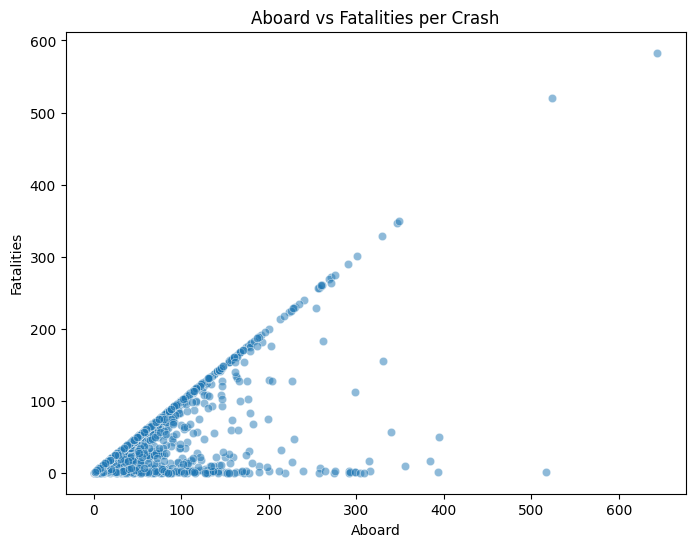

In [7]:
comparison = fatality_locations.copy()
comparison['Survivors'] = comparison['Aboard'] - comparison['Fatalities']
display(comparison.head(10))
print(comparison[['Aboard', 'Fatalities', 'Survivors']].describe())

plt.figure(figsize=(8, 6))
sns.scatterplot(data=comparison, x='Aboard', y='Fatalities', alpha=0.5)
plt.title('Aboard vs Fatalities per Crash')
plt.show()

In [8]:
no_fatalities = fatality_locations[fatality_locations['Fatalities'] == 0]
print(f"Crashes with no fatalities: {len(no_fatalities)}")
no_fatalities

Crashes with no fatalities: 58


,Date,Location,Aboard,Fatalities
108,10/21/1926,English Channel,12.0,0.0
387,03/05/1936,"Near Tengya, China",6.0,0.0
889,10/08/1947,"Near El Paso, Texas",54.0,0.0
897,11/11/1947,"Gallup, New Mexico",25.0,0.0
1265,05/25/1953,"Amsterdam, Netherlands",34.0,0.0
1359,01/19/1955,"Des Moines, Iowa",39.0,0.0
1440,09/09/1956,"Bartlesville, Oklahoma",18.0,0.0
1443,10/16/1956,Over the PacifiOcean,31.0,0.0
1610,06/30/1959,"Ishikawa City, Ryukyu Island, Okinawa",1.0,0.0
1837,02/28/1963,"Boston, Massachusetts",26.0,0.0


Question 8

In [9]:
split_loc = fatality_locations['Location'].str.rsplit(',', n=1, expand=True)
fatality_locations['Region'] = split_loc[0].str.strip()
fatality_locations['State/Country'] = split_loc[1].str.strip()

no_comma = fatality_locations['State/Country'].isna() & fatality_locations['Location'].notna()
fatality_locations.loc[no_comma, 'State/Country'] = fatality_locations.loc[no_comma, 'Region']
fatality_locations.loc[no_comma, 'Region'] = np.nan

fatality_locations = fatality_locations[['Date', 'Region', 'State/Country', 'Aboard', 'Fatalities']]
fatality_locations.head(15)

,Date,Region,State/Country,Aboard,Fatalities
0,09/17/1908,Fort Myer,Virginia,2.0,1.0
1,07/12/1912,AtlantiCity,New Jersey,5.0,5.0
2,08/06/1913,"Victoria, British Columbia",Canada,1.0,1.0
3,09/09/1913,NaN,Over the North Sea,20.0,14.0
4,10/17/1913,Near Johannisthal,Germany,30.0,30.0
5,03/05/1915,Tienen,Belgium,41.0,21.0
6,09/03/1915,Off Cuxhaven,Germany,19.0,19.0
7,07/28/1916,Near Jambol,Bulgeria,20.0,20.0
8,09/24/1916,Billericay,England,22.0,22.0
9,10/01/1916,Potters Bar,England,19.0,19.0


Question 9

In [10]:
top_100 = fatality_locations.sort_values(by='Fatalities', ascending=False).head(100).reset_index(drop=True)
top_100

,Date,Region,State/Country,Aboard,Fatalities
0,03/27/1977,Tenerife,Canary Islands,644.0,583.0
1,08/12/1985,"Mt. Osutaka, near Ueno Village",Japan,524.0,520.0
2,11/12/1996,Near Charkhidadri,India,349.0,349.0
3,03/03/1974,Near Ermenonville,France,346.0,346.0
4,06/23/1985,AtlantiOcean,110 miles West of Ireland,329.0,329.0
5,08/19/1980,Near Riyadh,Saudi Arabia,301.0,301.0
6,07/03/1988,"Over the Persian Gulf, near Bandar Abbas",Iran,290.0,290.0
7,02/19/2003,Near Shahdad,Iran,275.0,275.0
8,05/25/1979,Chicago O'Hare,Illinois,271.0,271.0
9,09/01/1983,Near Sakhalin Island,Russia,269.0,269.0


Question 10

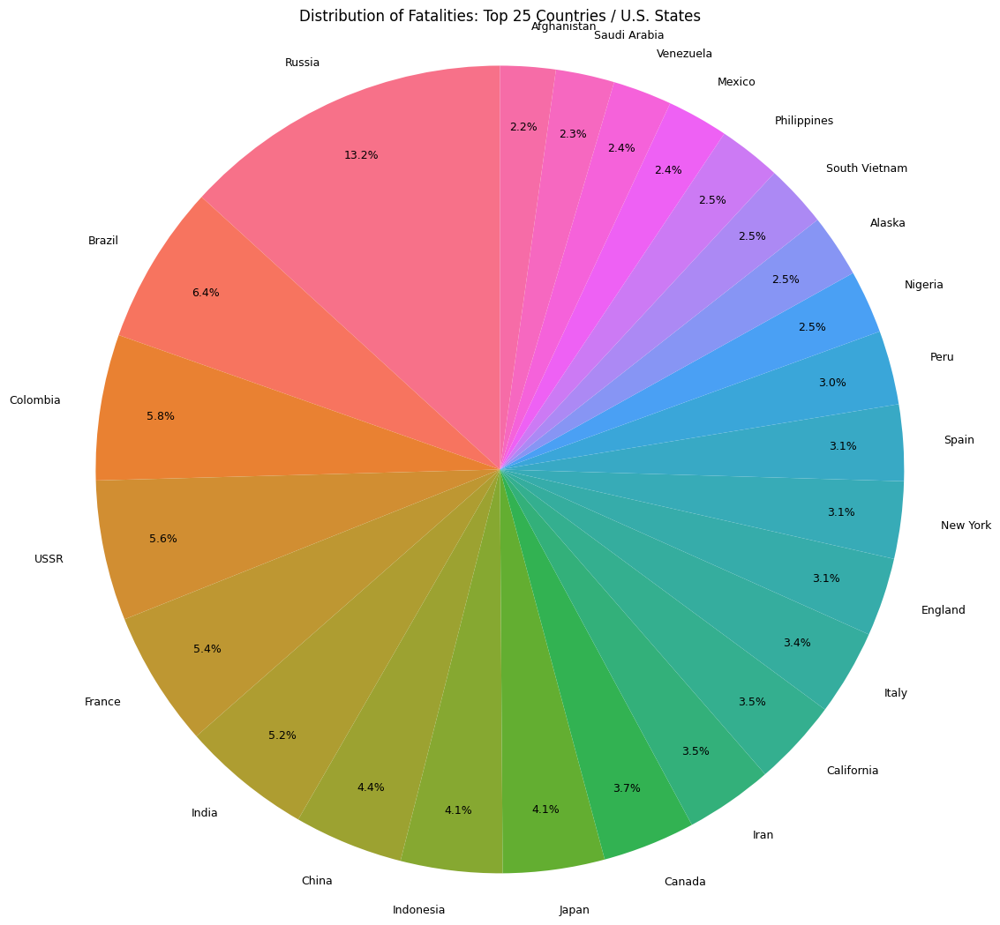

In [11]:
top_25 = fatality_locations.groupby('State/Country')['Fatalities'].sum().sort_values(ascending=False).head(25)

colors = sns.color_palette('husl', 25)
plt.figure(figsize=(13, 13))
plt.pie(top_25, labels=top_25.index, autopct='%1.1f%%', startangle=90,
        colors=colors, pctdistance=0.85, textprops={'fontsize': 9})
plt.title('Distribution of Fatalities: Top 25 Countries / U.S. States')
plt.axis('equal')
plt.show()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


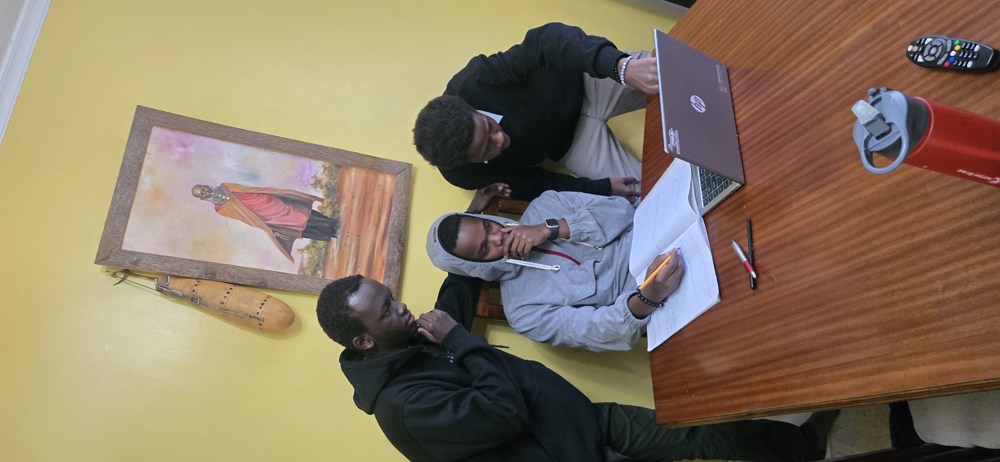

In [14]:
   from google.colab import drive
   from IPython.display import Image, display
   drive.mount('/content/drive')
display(Image('/content/drive/MyDrive/teamphoto.jpg', width=600))